In [3]:
import pydicom

file_path = "/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.2.840.1750081068.664.1835093006623933/1.2.840.1750081068.664.1835093006624001.dcm"

ds = pydicom.dcmread(file_path)

print(ds)

print("Patient ID:", getattr(ds, "PatientID", "N/A"))
print("Modality:", getattr(ds, "Modality", "N/A"))
print("Study Date:", getattr(ds, "StudyDate", "N/A"))

if hasattr(ds, "Rows") and hasattr(ds, "Columns"):
    print("Image size:", ds.Rows, "x", ds.Columns)
else:
    print("No image data found in this DICOM file.")

Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 186
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Encapsulated PDF Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.2.840.1750081068.664.1835093006624001
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '20250616'
(0008,0013) Instance Creation Time              TM: '203748'
(0008,0016) SOP Class UID                       UI: Encapsulated PDF Storage
(0008,0018) SOP Instance UID                    UI: 1.2.840.1750081068.664.1835093006624001
(0008,0020) Study Date   

In [4]:
import os
import pydicom

def explore_dicoms(root_path):
    for dirpath, dirnames, filenames in os.walk(root_path):
        dcm_files = [f for f in filenames if f.endswith('.dcm')]
        if dcm_files:
            first_dcm = os.path.join(dirpath, dcm_files[0])
            try:
                ds = pydicom.dcmread(first_dcm)
                print(f"Folder: {dirpath}")
                print(f"  Modality: {ds.get('Modality', 'Unknown')}")
                print(f"  Series Description: {ds.get('SeriesDescription', 'Unknown')}")
                print(f"  Sequence Name: {ds.get('SequenceName', 'Unknown')}")
                print(f"  Study Date: {ds.get('StudyDate', 'Unknown')}")
                print(f"  Image size: {getattr(ds, 'Rows', '?')} x {getattr(ds, 'Columns', '?')}")
                print(f"  Number of files: {len(dcm_files)}")
                print("-" * 40)
            except Exception as e:
                print(f"Could not read DICOM in {dirpath}: {e}")

explore_dicoms("HOANG")


In [5]:
import os
import pydicom

def classify_dicom_files(input_dir):
    doc_only = []
    image_only = []
    both_doc_and_image = []

    for root, _, files in os.walk(input_dir):
        for file in files:
            if file.lower().endswith(".dcm"):
                filepath = os.path.join(root, file)
                try:
                    ds = pydicom.dcmread(filepath, stop_before_pixels=False, force=True)

                    has_doc = 'EncapsulatedDocument' in ds
                    has_image = 'PixelData' in ds or ('Rows' in ds and 'Columns' in ds)

                    if has_doc and has_image:
                        both_doc_and_image.append(filepath)
                    elif has_doc:
                        doc_only.append(filepath)
                    elif has_image:
                        image_only.append(filepath)

                except Exception as e:
                    print(f"Error reading {filepath}: {e}")

    return doc_only, image_only, both_doc_and_image

folder_path = "/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH"

doc_only, image_only, both = classify_dicom_files(folder_path)

print("DICOM file inculdes document (PDF, DOC):", len(doc_only))
print("DICOM file includes images:", len(image_only))
print("DICOM file includes both document and images:", len(both))

DICOM file inculdes document (PDF, DOC): 1
DICOM file includes images: 474
DICOM file includes both document and images: 0


In [6]:
if doc_only:
    print("\File path includes document:")
    for path in doc_only:
        print(path)
else:
    print("\nNo DICOM files includes document.")

\File path includes document:
/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.2.840.1750081068.664.1835093006623933/1.2.840.1750081068.664.1835093006624001.dcm


In [7]:
import pydicom
import os

def extract_pdf_from_dicom(dcm_path, output_dir):
    ds = pydicom.dcmread(dcm_path, force=True)
    
    if 'EncapsulatedDocument' in ds:
        base_name = os.path.splitext(os.path.basename(dcm_path))[0]
        output_pdf = os.path.join(output_dir, base_name + ".pdf")
        
        with open(output_pdf, "wb") as f:
            f.write(ds.EncapsulatedDocument)
        
        print(f"PDF extracted: {output_pdf}")
    else:
        print(f"No PDF found in {dcm_path}")

dcm_file = "/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.2.840.1750081068.664.1835093006623933/1.2.840.1750081068.664.1835093006624001.dcm"
output_folder = "output_pdfs"
os.makedirs(output_folder, exist_ok=True)

extract_pdf_from_dicom(dcm_file, output_folder)

PDF extracted: output_pdfs/1.2.840.1750081068.664.1835093006624001.pdf


In [22]:
import os
import pydicom
import matplotlib.pyplot as plt
import numpy as np
from glob import glob

def inspect_dicom_folder(folder_path):
    print(f"\nInspecting folder: {folder_path}")

    dicom_files = sorted(glob(os.path.join(folder_path, '**'), recursive=True))
    dicom_files = [f for f in dicom_files if os.path.isfile(f)]

    if not dicom_files:
        print("  No files found.")
        return

    datasets = []
    for file in dicom_files:
        try:
            ds = pydicom.dcmread(file, force=True)
            datasets.append(ds)
        except:
            continue

    if not datasets:
        print("  No valid DICOM files found.")
        return

    # Filter only image datasets
    image_datasets = [ds for ds in datasets if hasattr(ds, 'pixel_array')]

    # Sort by InstanceNumber
    def get_sort_key(ds):
        return getattr(ds, 'InstanceNumber', 
               getattr(ds, 'SliceLocation', 
               ds.ImagePositionPatient[2] if hasattr(ds, 'ImagePositionPatient') else 0))

    image_datasets.sort(key=get_sort_key)

    if image_datasets:
        ds0 = image_datasets[0]
        modality = ds0.get("Modality", "Unknown")
        study_date = ds0.get("StudyDate", "Unknown")
        series_desc = ds0.get("SeriesDescription", "Unknown")
        protocol_name = ds0.get("ProtocolName", "Unknown")
        photo_interp = ds0.get("PhotometricInterpretation", "Unknown")

        img_shape = ds0.pixel_array.shape
        num_slices = len(image_datasets)

        print(f"  Modality: {modality}")
        print(f"  Series Description: {series_desc}")
        print(f"  Protocol Name: {protocol_name}")
        print(f"  Study Date: {study_date}")
        print(f"  Image size: {img_shape}")
        print(f"  Number of slices: {num_slices}")
        print(f"  Photometric interpretation: {photo_interp}")

        cols = min(6, num_slices)
        rows = (num_slices + cols - 1) // cols
        fig, axes = plt.subplots(rows, cols, figsize=(12, 2.5 * rows))
        axes = np.array(axes).reshape(-1)

        for i, ax in enumerate(axes):
            if i < num_slices:
                ax.imshow(image_datasets[i].pixel_array, cmap='gray')
                ax.set_title(f"Slice {i+1}")
                ax.axis('off')
            else:
                ax.axis('off')
        plt.tight_layout()
        plt.show()

    else:
        # No image slices, print metadata
        ds0 = datasets[0]
        print(ds0)

In [23]:
inspect_dicom_folder("/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.2.840.1750081068.664.1835093006623933")


Inspecting folder: /home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.2.840.1750081068.664.1835093006623933
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 186
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Encapsulated PDF Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.2.840.1750081068.664.1835093006624001
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '20250616'
(0008,0013) Instance Creation Time              TM: '203748'
(0008,0016) SOP Class UID              


Inspecting folder: /home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.5448.2025061619270990852
  Modality: MR
  Series Description: RL
  Protocol Name: RL
  Study Date: 20250616
  Image size: (512, 512)
  Number of slices: 12
  Photometric interpretation: MONOCHROME2


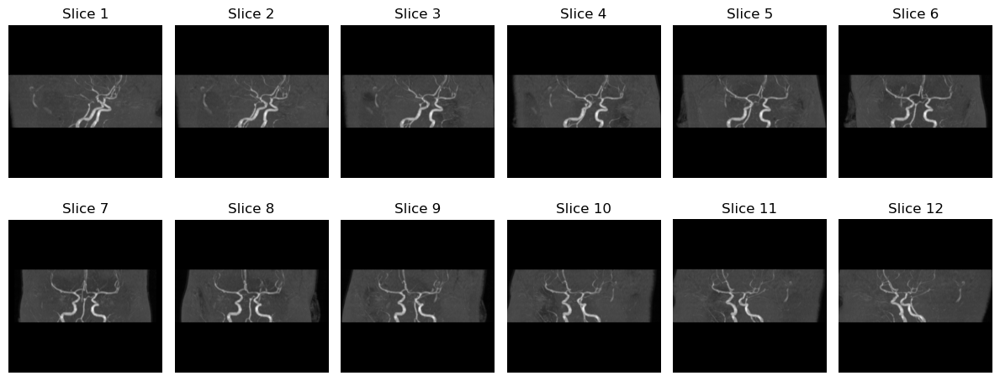

In [24]:
inspect_dicom_folder("/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.5448.2025061619270990852")


Inspecting folder: Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.5448.2025061619271237865
  Modality: MR
  Series Description: FH
  Protocol Name: FH
  Study Date: 20250616
  Image size: (512, 512)
  Number of slices: 12
  Photometric interpretation: MONOCHROME2


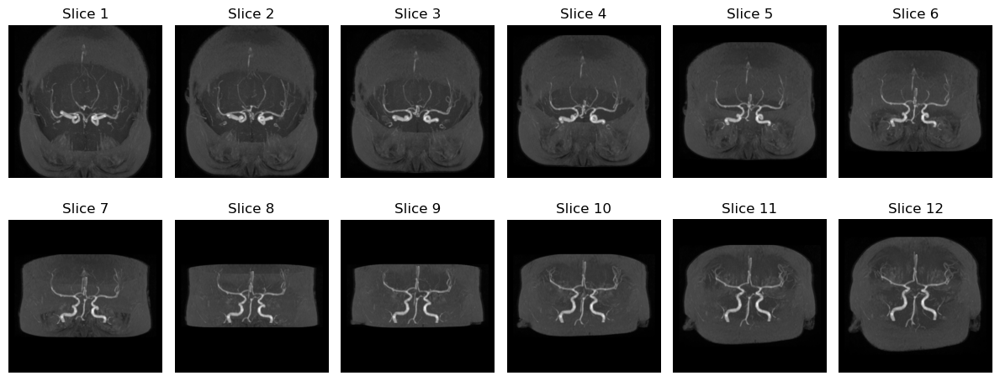

In [25]:
inspect_dicom_folder("Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.5448.2025061619271237865")


Inspecting folder: /home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6256.2025061619273110000
  Modality: MR
  Series Description: esT2W_TSE SENSE
  Study Date: 20250616
  Image size: (256, 256)
  Number of slices: 20
  Photometric interpretation: MONOCHROME2


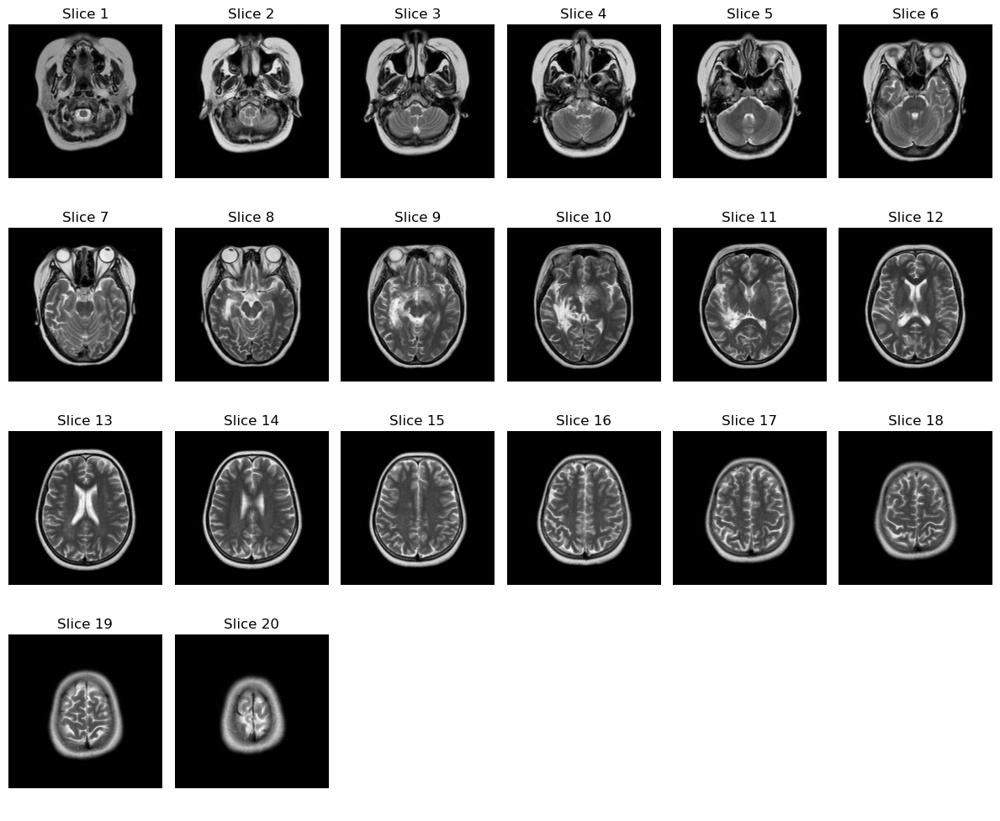

In [14]:
inspect_dicom_folder("/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6256.2025061619273110000")

In [15]:
inspect_dicom_folder("/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6256.2025061619273114002")


Inspecting folder: /home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6256.2025061619273114002
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 212
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.33202.5.0.6256.2025061619273110001
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '202

In [16]:
inspect_dicom_folder("/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619220250364")


Inspecting folder: /home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619220250364
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 212
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.33202.5.0.6280.2025061619220251365
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '202

In [17]:
inspect_dicom_folder("/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619261578368")


Inspecting folder: /home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619261578368
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 212
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.33202.5.0.6280.2025061619261582369
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '202

In [18]:
inspect_dicom_folder("/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619263885372")


Inspecting folder: /home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619263885372
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 218
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.0.0.51.4.32.0.33202.1.4864.1750077800953
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA

In [42]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619353170376")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619353170376
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 212
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.33202.5.0.6280.2025061619353175377
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '20250616'
(0008,0013) Instance Cre

In [43]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619364339380")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619364339380
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 212
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.33202.5.0.6280.2025061619364342381
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '20250616'
(0008,0013) Instance Cre

In [44]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619364360384")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619364360384
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 212
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.33202.5.0.6280.2025061619364364385
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '20250616'
(0008,0013) Instance Cre

In [45]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619364418388")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619364418388
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 212
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.33202.5.0.6280.2025061619364421389
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '20250616'
(0008,0013) Instance Cre

In [46]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619364459392")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619364459392
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 212
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.33202.5.0.6280.2025061619364468393
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '20250616'
(0008,0013) Instance Cre

In [47]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619370487396")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619370487396
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 212
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.33202.5.0.6280.2025061619370500397
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '20250616'
(0008,0013) Instance Cre

In [48]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619401060400")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6280.2025061619401060400
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 212
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.33202.5.0.6280.2025061619401076401
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '20250616'
(0008,0013) Instance Cre


Inspecting folder: /home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619214918207
  Modality: MR
  Series Description: Survey
  Study Date: 20250616
  Image size: (256, 256)
  Number of slices: 5
  Photometric interpretation: MONOCHROME2


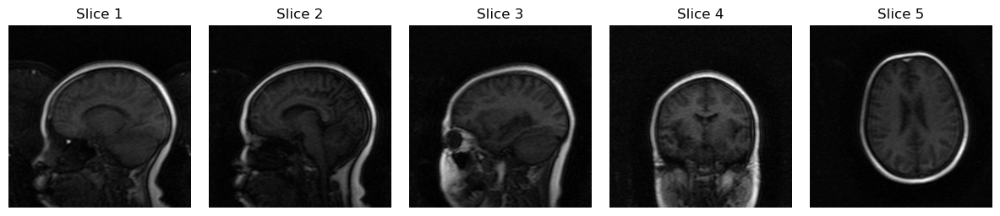

In [19]:
inspect_dicom_folder("/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619214918207")


Inspecting folder: /home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619231123234
  Modality: MR
  Series Description: sT2W_FLAIR
  Study Date: 20250616
  Image size: (256, 256)
  Number of slices: 24
  Photometric interpretation: MONOCHROME2


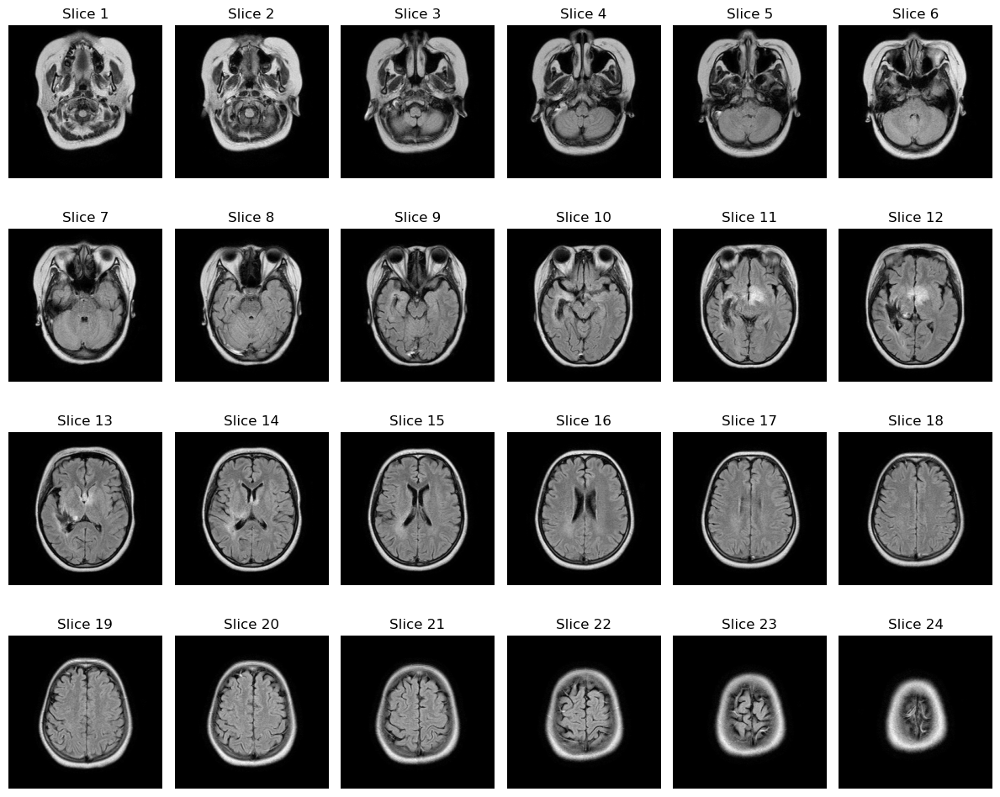

In [20]:
inspect_dicom_folder("/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619231123234")


Inspecting folder: /home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619244167268
  Modality: MR
  Series Description: sT1W_FFE
  Study Date: 20250616
  Image size: (432, 432)
  Number of slices: 12
  Photometric interpretation: MONOCHROME2


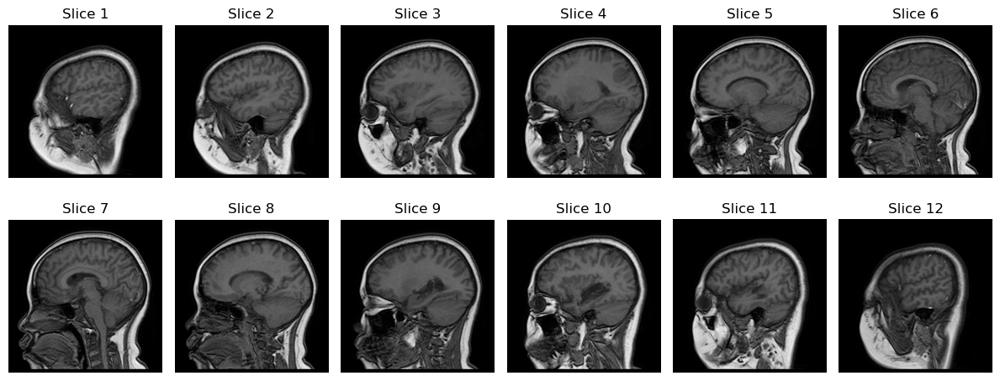

In [21]:
inspect_dicom_folder("/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619244167268")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619250132269
  Modality: MR
  Series Description: DWI
  Study Date: 20250616
  Image size: (224, 224)
  Number of slices: 100
  Photometric interpretation: MONOCHROME2


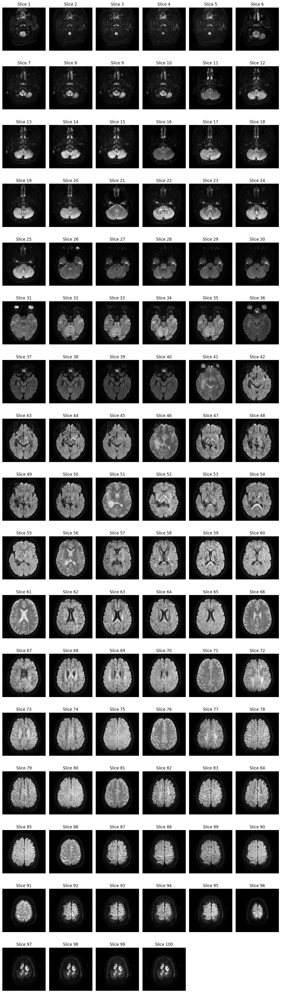

In [59]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619250132269")


Inspecting folder: Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619253606298
  Modality: MR
  Series Description: s3DI_TOF_BM
  Protocol Name: s3DI_TOF_BM SENSE
  Study Date: 20250616
  Image size: (512, 512)
  Number of slices: 80
  Photometric interpretation: MONOCHROME2


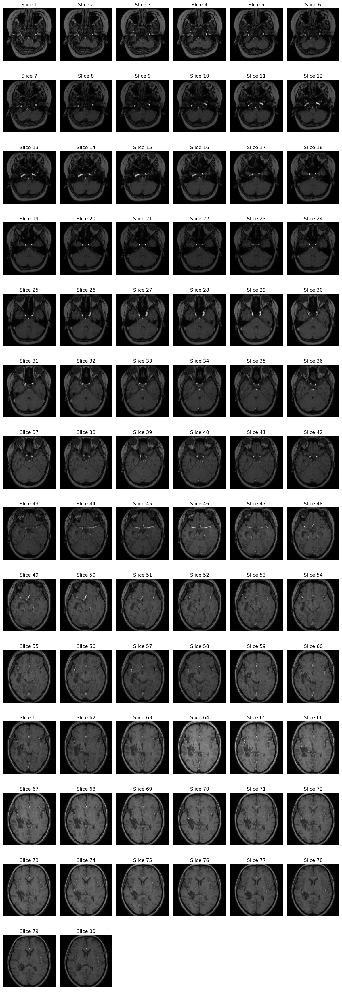

In [28]:
inspect_dicom_folder("Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619253606298")


Inspecting folder: /home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619253610306
  Modality: MR
  Series Description: s3DI_TOF_BM
  Protocol Name: MIP s3DI_TOF_BM SENSE
  Study Date: 20250616
  Image size: (512, 512)
  Number of slices: 3
  Photometric interpretation: MONOCHROME2


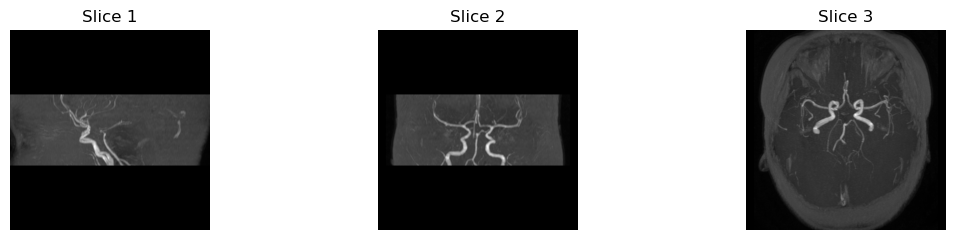

In [26]:
inspect_dicom_folder("/home/freedino/Desktop/bidscoin/dicom_data/BUI_HOANG_LINH/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619253610306")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619270504475
  Modality: MR
  Series Description: sT2W_TSE
  Study Date: 20250616
  Image size: (256, 256)
  Number of slices: 20
  Photometric interpretation: MONOCHROME2


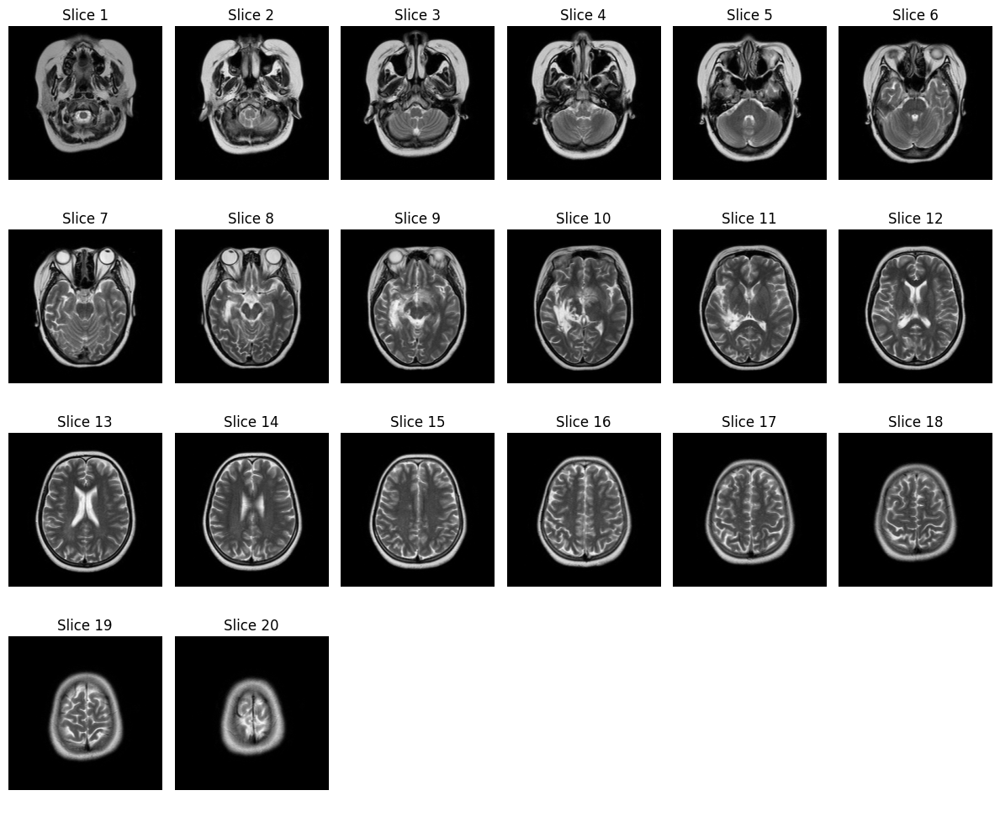

In [62]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619270504475")

In [63]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619303293533")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619303293533
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 202
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: 1.2.276.0.7230010.3.1.0.1
(0002,0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.330041088.9656.1752415851.158485
(0002,0010) Transfer Syntax UID                 UI: JPEG-LS Lossless Image Compression
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
-------------------------------------------------
(0008,0080) Institution Name                    LO: ''
(0008,0081) Institution Address                 ST: ''
(0010,0010) Patient's Name                      PN: ''
(0010,0020) Patient ID                          LO: ''



Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619385028442
  Modality: MR
  Series Description: sT1W_3D_FFE
  Study Date: 20250616
  Image size: (256, 256)
  Number of slices: 130
  Photometric interpretation: MONOCHROME2


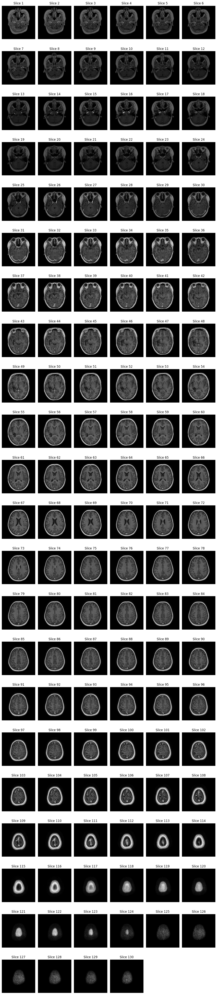

In [64]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.7048.2025061619385028442")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.10380.2025061619254021000
  Modality: MR
  Series Description: sDWI SENSE
  Study Date: 20250616
  Image size: (224, 224)
  Number of slices: 20
  Photometric interpretation: MONOCHROME2


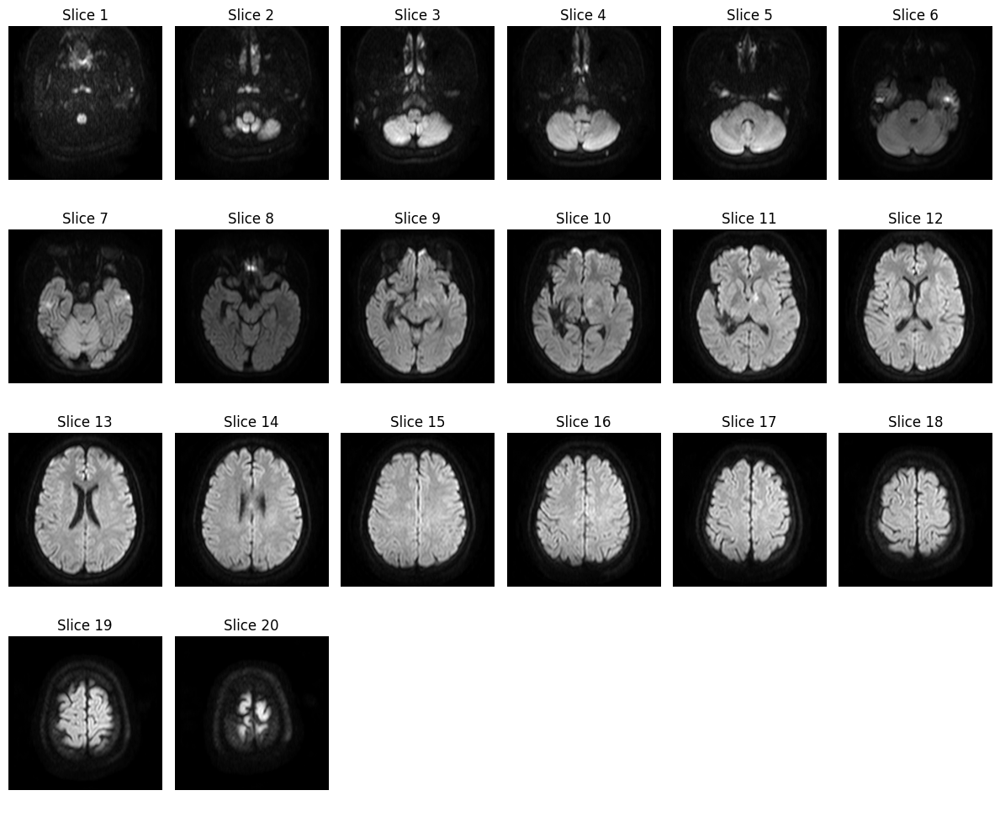

In [65]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.10380.2025061619254021000")

In [66]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.10380.2025061619254025002")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.10380.2025061619254025002
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 212
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.33202.5.0.10380.2025061619254021001
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '20250616'
(0008,0013) Instance C


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.10968.2025061619250509000
  Modality: MR
  Series Description: esT1W_FFE SENSE
  Study Date: 20250616
  Image size: (432, 432)
  Number of slices: 12
  Photometric interpretation: MONOCHROME2


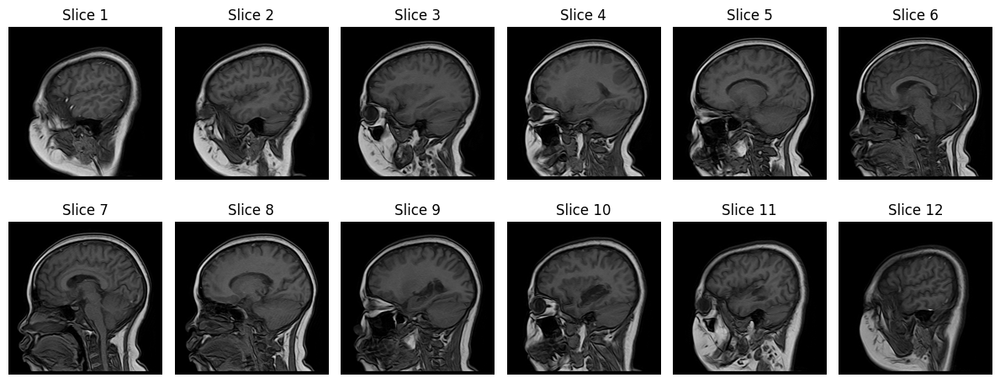

In [67]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.10968.2025061619250509000")

In [68]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.10968.2025061619250512002")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.10968.2025061619250512002
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 212
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.33202.5.0.10968.2025061619250509001
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '20250616'
(0008,0013) Instance C


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.11544.2025061619244209000
  Modality: MR
  Series Description: esT2W_FLAIR SENSE
  Study Date: 20250616
  Image size: (256, 256)
  Number of slices: 24
  Photometric interpretation: MONOCHROME2


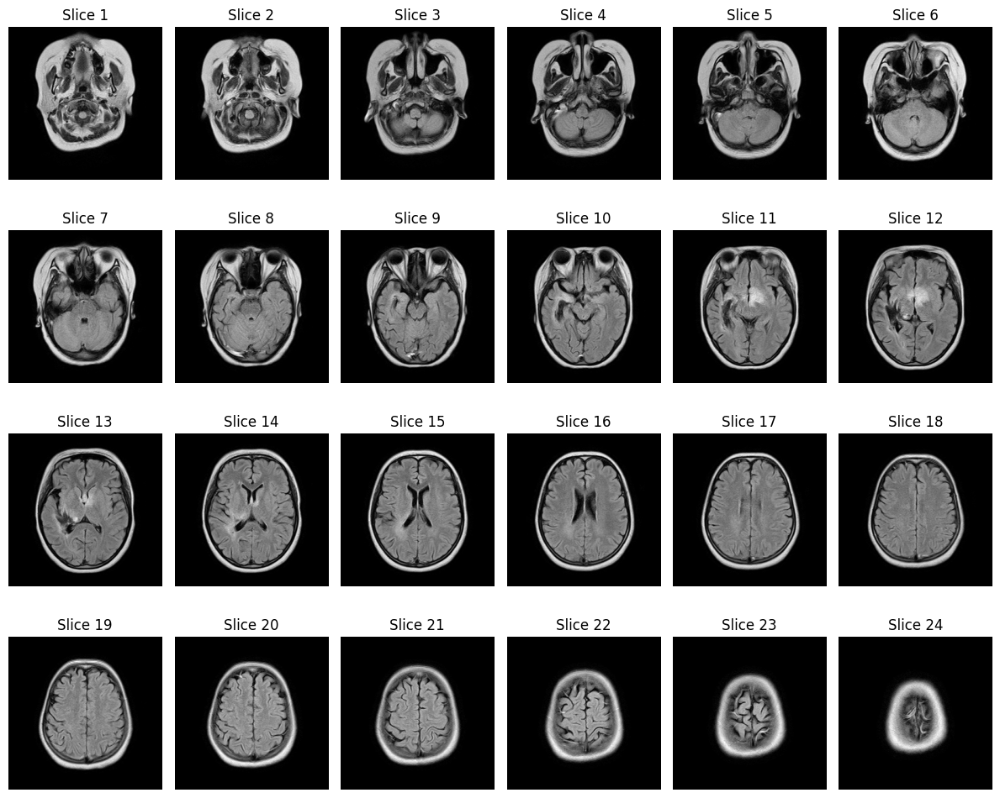

In [69]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.11544.2025061619244209000")

In [70]:
inspect_dicom_folder("/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.11544.2025061619244212002")


Inspecting folder: /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.11544.2025061619244212002
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 212
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Grayscale Softcopy Presentation State Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.46.670589.11.33202.5.0.11544.2025061619244209001
(0002,0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.5
(0002,0013) Implementation Version Name         SH: 'OFFIS_DCMTK_365'
(0002,0016) Source Application Entity Title     AE: 'ACHIEVA'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0012) Instance Creation Date              DA: '20250616'
(0008,0013) Instance C

## Pipeline

In [ ]:
import os
from pathlib import Path
import pydicom

import numpy as np
import nibabel as nib
import shutil
from tqdm import tqdm

import warnings
warnings.filterwarnings("ignore")

DICOM_ROOT = Path("HOANG")
BIDS_ROOT = Path("BIDS_dataset")
SUBJECT_ID = "sub-001"
SUBJECT_DIR = BIDS_ROOT / SUBJECT_ID

ANAT_DIR = SUBJECT_DIR / "anat"
DWI_DIR = SUBJECT_DIR / "dwi"
REPORTS_DIR = SUBJECT_DIR / "reports"
SOURCEDATA_DIR = SUBJECT_DIR / "sourcedata"

for folder in [ANAT_DIR, DWI_DIR, REPORTS_DIR, SOURCEDATA_DIR]:
    folder.mkdir(parents=True, exist_ok=True)

def is_multislice(dcm_list):
    return len(dcm_list) > 1 and hasattr(dcm_list[0], "ImagePositionPatient")

def load_dicom_series(folder):
    dcm_files = [pydicom.dcmread(str(f)) for f in sorted(folder.glob("*.dcm")) if f.is_file()]
    dcm_files = sorted(dcm_files, key=lambda d: float(d.ImagePositionPatient[2]) if hasattr(d, "ImagePositionPatient") else 0)
    return dcm_files

def convert_to_nifti(dcm_list, output_path):
    array3d = np.stack([d.pixel_array for d in dcm_list], axis=-1)
    affine = np.eye(4)
    nib.save(nib.Nifti1Image(array3d, affine), output_path)

def extract_pdf(ds, out_path):
    if hasattr(ds, "EncapsulatedDocument"):
        pdf_data = ds.EncapsulatedDocument
        if pdf_data:
            with open(out_path, "wb") as f:
                f.write(pdf_data)
            print(f"[REPORT] PDF saved: {out_path}")

def handle_folder(folder: Path):
    dcm_files = list(folder.glob("*.dcm"))
    if not dcm_files:
        return

    try:
        ds = pydicom.dcmread(str(dcm_files[0]), stop_before_pixels=False)
    except Exception as e:
        print(f"[ERROR] Failed to read {folder}: {e}")
        return

    modality = getattr(ds, "Modality", "")
    desc = getattr(ds, "SeriesDescription", "")
    sop_class = getattr(ds, "SOPClassUID", "")
    uid_name = folder.name
    file_stem = uid_name

    if hasattr(ds, "EncapsulatedDocument"):
        extract_pdf(ds, REPORTS_DIR / f"{file_stem}_report.pdf")

    if modality == "PR" or "SIGNATURE" in desc.upper():
        target = SOURCEDATA_DIR / f"{file_stem}_PR.dcm"
        shutil.copy(dcm_files[0], target)

    elif modality in ["MR", "CT"]:
        dcm_series = load_dicom_series(folder)
        if is_multislice(dcm_series):
            desc_lower = desc.lower()
            if "diff" in desc_lower or "dwi" in desc_lower:
                out_path = DWI_DIR / f"{file_stem}_dwi.nii.gz"
            elif "flair" in desc_lower:
                out_path = ANAT_DIR / f"{file_stem}_FLAIR.nii.gz"
            elif "t2" in desc_lower:
                out_path = ANAT_DIR / f"{file_stem}_T2w.nii.gz"
            elif "tof" in desc_lower or "t2star" in desc_lower:
                out_path = ANAT_DIR / f"{file_stem}_T2star.nii.gz"
            else:
                out_path = ANAT_DIR / f"{file_stem}_T1w.nii.gz"

            convert_to_nifti(dcm_series, out_path)
            print(f"[NIFTI] Saved: {out_path}")
        else:
            # If only one slice, copy to sourcedata
            target = SOURCEDATA_DIR / f"{file_stem}.dcm"
            shutil.copy(dcm_files[0], target)
    else:
        # If modality is not recognized, copy to sourcedata
        target = SOURCEDATA_DIR / f"{file_stem}_UNKNOWN.dcm"
        shutil.copy(dcm_files[0], target)

all_folders = [f for f in DICOM_ROOT.glob("**/*") if f.is_dir() and list(f.glob("*.dcm"))]

for folder in tqdm(all_folders, desc="Processing DICOM folders"):
    handle_folder(folder)

print("DONE! Output saved to:", BIDS_ROOT)

Processing DICOM folders:   0%|          | 0/30 [00:00<?, ?it/s]

Processing DICOM folders:   7%|▋         | 2/30 [00:00<00:01, 15.94it/s]

[NIFTI] Saved: BIDS_dataset/sub-001/dwi/1.3.46.670589.11.33202.5.0.10380.2025061619254021000_dwi.nii.gz
[NIFTI] Saved: BIDS_dataset/sub-001/anat/1.3.46.670589.11.33202.5.0.7048.2025061619253610306_T2star.nii.gz
[REPORT] PDF saved: BIDS_dataset/sub-001/reports/1.2.840.1750081068.664.1835093006623933_report.pdf


Processing DICOM folders:  17%|█▋        | 5/30 [00:00<00:02,  8.57it/s]

[NIFTI] Saved: BIDS_dataset/sub-001/dwi/1.3.46.670589.11.33202.5.0.7048.2025061619250132269_dwi.nii.gz


Processing DICOM folders:  40%|████      | 12/30 [00:01<00:02,  8.81it/s]

[NIFTI] Saved: BIDS_dataset/sub-001/anat/1.3.46.670589.11.33202.5.0.7048.2025061619385028442_T1w.nii.gz
[NIFTI] Saved: BIDS_dataset/sub-001/anat/1.3.46.670589.11.33202.5.0.10968.2025061619250509000_T1w.nii.gz


Processing DICOM folders:  47%|████▋     | 14/30 [00:01<00:01, 10.09it/s]

[NIFTI] Saved: BIDS_dataset/sub-001/anat/1.3.46.670589.11.33202.5.0.7048.2025061619231123234_FLAIR.nii.gz
[NIFTI] Saved: BIDS_dataset/sub-001/anat/1.3.46.670589.11.33202.5.0.7048.2025061619244167268_T1w.nii.gz


Processing DICOM folders:  63%|██████▎   | 19/30 [00:02<00:01,  9.81it/s]

[NIFTI] Saved: BIDS_dataset/sub-001/anat/1.3.46.670589.11.33202.5.0.5448.2025061619271237865_T1w.nii.gz
[NIFTI] Saved: BIDS_dataset/sub-001/anat/1.3.46.670589.11.33202.5.0.7048.2025061619214918207_T1w.nii.gz
[NIFTI] Saved: BIDS_dataset/sub-001/anat/1.3.46.670589.11.33202.5.0.11544.2025061619244209000_FLAIR.nii.gz


Processing DICOM folders:  80%|████████  | 24/30 [00:03<00:01,  5.80it/s]

[NIFTI] Saved: BIDS_dataset/sub-001/anat/1.3.46.670589.11.33202.5.0.7048.2025061619253606298_T2star.nii.gz
[NIFTI] Saved: BIDS_dataset/sub-001/anat/1.3.46.670589.11.33202.5.0.6256.2025061619273110000_T2w.nii.gz
[NIFTI] Saved: BIDS_dataset/sub-001/anat/1.3.46.670589.11.33202.5.0.5448.2025061619270990852_T1w.nii.gz


Processing DICOM folders: 100%|██████████| 30/30 [00:03<00:00,  8.23it/s]

[NIFTI] Saved: BIDS_dataset/sub-001/anat/1.3.46.670589.11.33202.5.0.7048.2025061619270504475_T2w.nii.gz
DONE! Output saved to: BIDS_dataset


In [ ]:
import os
import subprocess

def convert_dicom_to_nifti_with_dcm2niix(dicom_folder, output_folder):
    os.makedirs(output_folder, exist_ok=True)
    
    command = [
        "dcm2niix",
        "-z", "y",                # Nén file NIfTI (.nii.gz)
        "-f", "%p_%s",            # Tên file theo protocol name và series number
        "-o", output_folder,      # Thư mục đầu ra
        dicom_folder              # Thư mục DICOM đầu vào
    ]
    
    print("Running command:", " ".join(command))
    result = subprocess.run(command, stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)
    
    print("stdout:\n", result.stdout)
    print("stderr:\n", result.stderr)

In [2]:
dicom_input_folder = "/home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.5448.2025061619270990852"
output_folder = "output"

convert_dicom_to_nifti_with_dcm2niix(dicom_input_folder, output_folder)

Running command: dcm2niix -z y -f %p_%s -o output /home/ntdung/Medical/HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.5448.2025061619270990852
stdout:
 Chris Rorden's dcm2niiX version v1.0.20250505  GCC13.3.0 x86-64 (64-bit Linux)
Found 12 DICOM file(s)
Slices not stacked: orientation varies (vNav or localizer?) [0.438096 0.896286 -0.0688702 0.0286061 -0.0904752 -0.995488] != [0.71912 -0.689868 0.0833633 0.0286061 -0.0904752 -0.995488]
Philips Scaling Values RS:RI:SS = 9.51111:0:0.000981631 (see PMC3998685)
Convert 1 DICOM as output/RL_603_i00012 (512x512x1x1)
Philips Scaling Values RS:RI:SS = 9.51111:0:0.000981631 (see PMC3998685)
Convert 1 DICOM as output/RL_603_i00003 (512x512x1x1)
Philips Scaling Values RS:RI:SS = 9.51111:0:0.000981631 (see PMC3998685)
Convert 1 DICOM as output/RL_603_i00001 (512x512x1x1)
Philips Scaling Values RS:RI:SS = 9.51111:0:0.000981631 (see PMC3998685)
Convert 1 DICOM as output/RL_603_i00007 (512x512x1x1)
Philips Scaling Values RS:RI:

In [3]:
dicom_input_folder = "HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6256.2025061619273110000"
output_folder = "converted_output"

convert_dicom_to_nifti_with_dcm2niix(dicom_input_folder, output_folder)

Running command: dcm2niix -z y -f %p_%s -o converted_output HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6256.2025061619273110000
stdout:
 Chris Rorden's dcm2niiX version v1.0.20250505  GCC13.3.0 x86-64 (64-bit Linux)
Found 20 DICOM file(s)
Philips Scaling Values RS:RI:SS = 3.99707:0:0.00441941 (see PMC3998685)
Convert 20 DICOM as converted_output/esT2W_TSE_SENSE_702 (256x256x20x1)
Conversion required 0.208731 seconds (0.176764 for core code).

stderr:
 


In [18]:
BIDS_MAP = {
    # Structural
    "T1w": ["t1", "t1w", "mprage", "spgr", "t1-weighted"],
    "T2w": ["t2", "t2w", "t2-weighted"],
    "FLAIR": ["flair"],
    "PD": ["pd", "proton density"],
    "T2star": ["t2star", "t2*"],
    
    # Diffusion
    "dwi": ["dti", "dwi", "diff", "diffusion"],
    
    # Functional
    "bold": ["bold", "fmri", "rest", "resting"],
    
    # Fieldmaps
    "fieldmap": ["fieldmap", "b0map", "gre_field_mapping"],
    
    # Perfusion
    "asl": ["asl", "perfusion"],

    # Susceptibility-weighted
    "swimag": ["swimag", "swi"],

    # Angiography
    "angio": ["angio", "angiography"],

    # Localizer or scout (non-BIDS, to be ignored)
    "localizer": ["localizer", "scout", "survey"],
}

In [ ]:
def get_bids_suffix(series_desc):
    desc = series_desc.lower()
    for suffix, keywords in BIDS_MAP.items():
        for kw in keywords:
            if kw in desc:
                return f"_{suffix}"
    return None

def convert_dicom_to_bids_nifti(dicom_folder_path, sub_index, output_root):
    sample_dcm = None
    for root, _, files in os.walk(dicom_folder_path):
        for file in files:
            if file.endswith(".dcm"):
                sample_dcm = pydicom.dcmread(os.path.join(root, file), stop_before_pixels=True)
                break
        if sample_dcm: break
    if not sample_dcm:
        print("❌ Không tìm thấy file DICOM trong thư mục:", dicom_folder_path)
        return
    
    sub_id = f"sub-{sub_index:04d}"
    study_date = sample_dcm.get("StudyDate", "00000000")
    ses_id = f"ses-{study_date}"
    series_desc = sample_dcm.get("SeriesDescription", "Unknown")

    suffix = get_bids_suffix(series_desc)
    if not suffix:
        print(f"⚠️ Không ánh xạ được SeriesDescription: {series_desc} -> BỎ QUA")
        return

    output_dir = os.path.join(output_root, sub_id, ses_id, "anat")
    os.makedirs(output_dir, exist_ok=True)
    
    output_name = f"{sub_id}_{ses_id}{suffix}"

    temp_output = os.path.join(output_dir, "tmp_niix")
    os.makedirs(temp_output, exist_ok=True)

    cmd = [
        "dcm2niix",
        "-z", "y",
        "-f", output_name,
        "-o", temp_output,
        dicom_folder_path
    ]
    subprocess.run(cmd, check=True)

    # Tìm file .nii.gz vừa tạo
    found = False
    for file in os.listdir(temp_output):
        if file.startswith(output_name) and file.endswith(".nii.gz"):
            shutil.move(os.path.join(temp_output, file), os.path.join(output_dir, file))
            found = True

        # Optional: copy luôn .json
        elif file.startswith(output_name) and file.endswith(".json"):
            shutil.move(os.path.join(temp_output, file), os.path.join(output_dir, file))

    shutil.rmtree(temp_output)

    if found:
        print(f"✅ Đã convert -> {output_dir}/{output_name}.nii.gz")
    else:
        print(f"⚠️ Không tìm thấy file .nii.gz sau khi convert. Tên dự kiến: {output_name}.nii.gz")

In [20]:
dicom_folder = "HOANG/123.151157033501811.1835050276390532/1.3.46.670589.11.33202.5.0.6256.2025061619273110000"
output_folder = "converted_output_1"

convert_dicom_to_bids_nifti(dicom_folder, 1, output_folder)

Chris Rorden's dcm2niiX version v1.0.20250505  GCC13.3.0 x86-64 (64-bit Linux)
Found 20 DICOM file(s)
Philips Scaling Values RS:RI:SS = 3.99707:0:0.00441941 (see PMC3998685)
Convert 20 DICOM as converted_output_1/sub-0001/ses-20250616/anat/tmp_niix/sub-0001_ses-20250616_T2w (256x256x20x1)
Conversion required 0.169849 seconds (0.169812 for core code).
✅ Đã convert -> converted_output_1/sub-0001/ses-20250616/anat/sub-0001_ses-20250616_T2w.nii.gz


In [ ]:
import os
import shutil
import subprocess
import pydicom
from pathlib import Path
from tqdm import tqdm

DICOM_ROOT = Path("patients")
BIDS_ROOT = Path("BIDS_dataset")
SOURCEDATA_ROOT = Path("sourcedata")
BIDS_MAP = {
    "T1w": ["t1", "t1w", "mprage", "spgr", "t1-weighted"],
    "T2w": ["t2", "t2w", "t2-weighted"],
    "FLAIR": ["flair"],
    "PD": ["pd", "proton density"],
    "T2star": ["t2star", "t2*"],
    "dwi": ["dti", "dwi", "diff", "diffusion"],
    "bold": ["bold", "fmri", "rest", "resting"],
    "fieldmap": ["fieldmap", "b0map", "gre_field_mapping"],
    "asl": ["asl", "perfusion"],
    "swimag": ["swimag", "swi"],
    "angio": ["angio", "angiography"],
    "localizer": ["localizer", "scout", "survey"],
}

def get_bids_suffix(series_desc):
    desc = series_desc.lower()
    for suffix, keywords in BIDS_MAP.items():
        for kw in keywords:
            if kw in desc:
                return suffix
    return None

def extract_encapsulated_pdf(ds, out_path):
    if hasattr(ds, "EncapsulatedDocument"):
        pdf_data = ds.EncapsulatedDocument
        if pdf_data:
            with open(out_path, "wb") as f:
                f.write(pdf_data)
            print(f"[PDF] Saved: {out_path}")

def convert_dicom_with_dcm2niix(dicom_folder, sub_id, ses_id, suffix, output_type):
    bids_sub_path = BIDS_ROOT / sub_id / ses_id / output_type
    bids_sub_path.mkdir(parents=True, exist_ok=True)
    output_name = f"{sub_id}_{ses_id}_{suffix}"
    tmp_dir = bids_sub_path / "tmp_niix"
    tmp_dir.mkdir(parents=True, exist_ok=True)

    cmd = [
        "dcm2niix",
        "-z", "y",
        "-f", output_name,
        "-o", str(tmp_dir),
        str(dicom_folder)
    ]
    try:
        subprocess.run(cmd, check=True, stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL)
    except subprocess.CalledProcessError:
        print(f"[ERROR] Failed dcm2niix on {dicom_folder}")
        shutil.rmtree(tmp_dir)
        return

    for f in tmp_dir.iterdir():
        if f.name.startswith(output_name):
            shutil.move(str(f), str(bids_sub_path / f.name))
    shutil.rmtree(tmp_dir)
    print(f"[NIfTI] {output_name} saved to {bids_sub_path}")

def handle_dicom_series(series_path: Path, sub_index: int):
    first_file = next(series_path.glob("*.dcm"), None)
    if not first_file:
        return
    try:
        ds = pydicom.dcmread(str(first_file), stop_before_pixels=True)
    except:
        print(f"[Bỏ qua] Không đọc được file DICOM: {first_file}")
        return

    sub_id = f"sub-{sub_index:04d}"
    study_date = ds.get("StudyDate", "00000000")
    ses_id = f"ses-{study_date}"
    series_desc = ds.get("SeriesDescription", "Unknown")
    modality = ds.get("Modality", "Unknown")
    sop_uid = series_path.name

    if hasattr(ds, "EncapsulatedDocument"):
        out_dir = SOURCEDATA_ROOT / sub_id / ses_id
        out_dir.mkdir(parents=True, exist_ok=True)
        pdf_path = out_dir / f"{sop_uid}_report.pdf"
        extract_encapsulated_pdf(ds, pdf_path)

    if modality == "PR" or len(list(series_path.glob("*.dcm"))) <= 1:
        out_dir = SOURCEDATA_ROOT / sub_id / ses_id
        out_dir.mkdir(parents=True, exist_ok=True)
        dst = out_dir / f"{sop_uid}_PR.dcm"
        shutil.copy(str(first_file), str(dst))
        return

    suffix = get_bids_suffix(series_desc)
    if not suffix:
        out_dir = SOURCEDATA_ROOT / sub_id / ses_id
        out_dir.mkdir(parents=True, exist_ok=True)
        dst = out_dir / f"{sop_uid}_Unknown.dcm"
        shutil.copy(str(first_file), str(dst))
        return

    output_type = "dwi" if suffix == "dwi" else "anat"
    convert_dicom_with_dcm2niix(series_path, sub_id, ses_id, suffix, output_type)

all_patients = sorted(DICOM_ROOT.glob("*"))
for i, patient_folder in enumerate(tqdm(all_patients, desc="Processing patients")):
    if not patient_folder.is_dir():
        continue
    series_folders = [f for f in patient_folder.glob("**/") if list(f.glob("*.dcm"))]
    for series in series_folders:
        handle_dicom_series(series, i + 1)

print("DONE!")

Processing patients:   0%|          | 0/2 [00:00<?, ?it/s]

[NIfTI] sub-0001_ses-20250616_dwi saved to BIDS_dataset/sub-0001/ses-20250616/dwi
[PDF] Saved: sourcedata/sub-0001/ses-20250616/1.2.840.1750081068.664.1835093006623933_report.pdf
[NIfTI] sub-0001_ses-20250616_dwi saved to BIDS_dataset/sub-0001/ses-20250616/dwi
[NIfTI] sub-0001_ses-20250616_T1w saved to BIDS_dataset/sub-0001/ses-20250616/anat
[NIfTI] sub-0001_ses-20250616_T1w saved to BIDS_dataset/sub-0001/ses-20250616/anat
[NIfTI] sub-0001_ses-20250616_T2w saved to BIDS_dataset/sub-0001/ses-20250616/anat
[NIfTI] sub-0001_ses-20250616_T1w saved to BIDS_dataset/sub-0001/ses-20250616/anat
[NIfTI] sub-0001_ses-20250616_localizer saved to BIDS_dataset/sub-0001/ses-20250616/anat
[NIfTI] sub-0001_ses-20250616_T2w saved to BIDS_dataset/sub-0001/ses-20250616/anat
[NIfTI] sub-0001_ses-20250616_T2w saved to BIDS_dataset/sub-0001/ses-20250616/anat


Processing patients:  50%|█████     | 1/2 [00:04<00:04,  4.73s/it]

[NIfTI] sub-0001_ses-20250616_T2w saved to BIDS_dataset/sub-0001/ses-20250616/anat
[NIfTI] sub-0002_ses-20250616_dwi saved to BIDS_dataset/sub-0002/ses-20250616/dwi
[PDF] Saved: sourcedata/sub-0002/ses-20250616/1.2.840.1750081068.664.1835093006623933_report.pdf
[NIfTI] sub-0002_ses-20250616_dwi saved to BIDS_dataset/sub-0002/ses-20250616/dwi
[NIfTI] sub-0002_ses-20250616_T1w saved to BIDS_dataset/sub-0002/ses-20250616/anat
[NIfTI] sub-0002_ses-20250616_T1w saved to BIDS_dataset/sub-0002/ses-20250616/anat
[NIfTI] sub-0002_ses-20250616_T2w saved to BIDS_dataset/sub-0002/ses-20250616/anat
[NIfTI] sub-0002_ses-20250616_T1w saved to BIDS_dataset/sub-0002/ses-20250616/anat
[NIfTI] sub-0002_ses-20250616_localizer saved to BIDS_dataset/sub-0002/ses-20250616/anat
[NIfTI] sub-0002_ses-20250616_T2w saved to BIDS_dataset/sub-0002/ses-20250616/anat
[NIfTI] sub-0002_ses-20250616_T2w saved to BIDS_dataset/sub-0002/ses-20250616/anat


Processing patients: 100%|██████████| 2/2 [00:09<00:00,  4.67s/it]

[NIfTI] sub-0002_ses-20250616_T2w saved to BIDS_dataset/sub-0002/ses-20250616/anat
DONE!


## Check Output

In [1]:
import nibabel as nib
import matplotlib.pyplot as plt
import math

def show_all_slices(nii_path):
    img = nib.load(nii_path)
    data = img.get_fdata()
    
    n_slices = data.shape[2]
    n_cols = 8
    n_rows = math.ceil(n_slices / n_cols)

    plt.figure(figsize=(n_cols * 2, n_rows * 2))
    
    for i in range(n_slices):
        plt.subplot(n_rows, n_cols, i + 1)
        plt.imshow(data[:, :, i], cmap="gray")
        plt.title(f"Slice {i+1}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

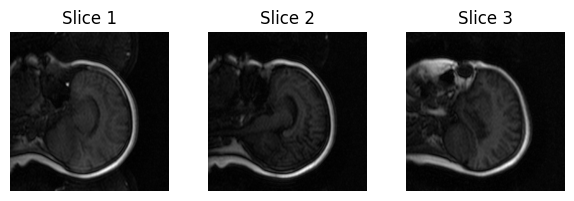

In [2]:
show_all_slices('/home/ntdung/Medical/BIDS_dataset/sub-0001/ses-20250616/anat/sub-0001_ses-20250616_localizer_i00001.nii.gz')

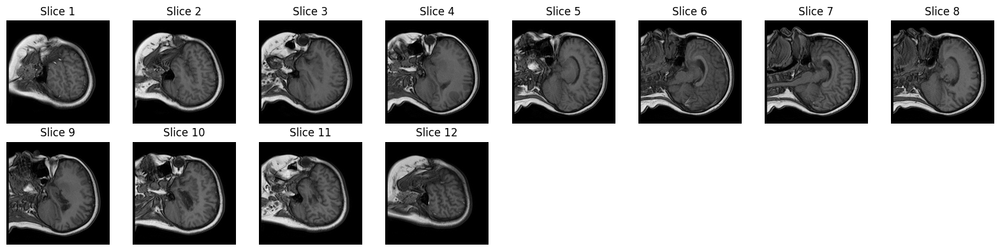

In [4]:
show_all_slices("/home/ntdung/Medical/BIDS_dataset/sub-0001/ses-20250616/anat/sub-0001_ses-20250616_T1w.nii.gz")

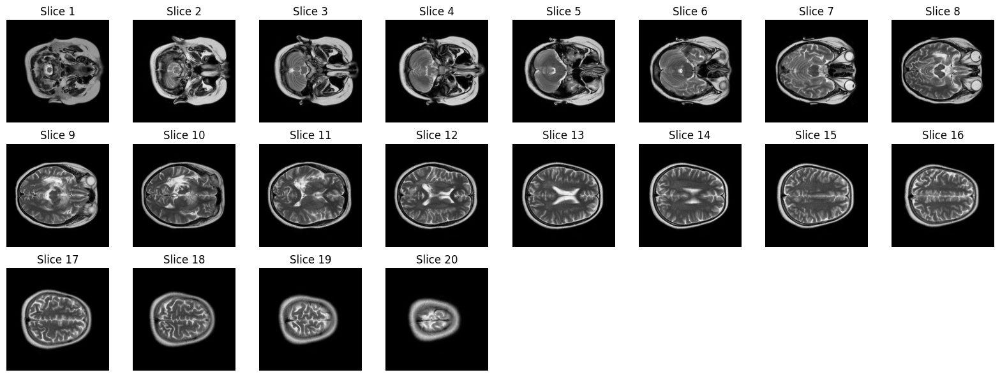

In [8]:
show_all_slices('/home/ntdung/Medical/BIDS_dataset/sub-0001/ses-20250616/anat/sub-0001_ses-20250616_T2w.nii.gz')